In [ ]:
!pip install -U kaggle_environments cpprb tqdm

Requirement already up-to-date: kaggle_environments in /usr/local/lib/python3.7/dist-packages (1.7.11)
Requirement already up-to-date: cpprb in /usr/local/lib/python3.7/dist-packages (10.1.0)
Requirement already up-to-date: tqdm in /usr/local/lib/python3.7/dist-packages (4.60.0)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
import torch.multiprocessing as mp
import matplotlib.pyplot as plt
from multiprocessing import set_start_method, cpu_count, Process, Event, SimpleQueue
import time
import copy
import numpy as np
import cpprb # Replay Buffer Library: https://ymd_h.gitlab.io/cpprb/
from tqdm.notebook import tqdm

from kaggle_environments.envs.hungry_geese.hungry_geese import Observation, Configuration, Action, row_col
from kaggle_environments import make

In [ ]:
# Configs for encoding the board

GOOSE = -1.0
RISK = -0.5
NONE = 0.0
FOOD = 1.0

act_shape = 4

WIDTH = 11
HEIGHT = 7

x_center = WIDTH//2 + 1
y_center = HEIGHT//2 + 1

EAST_idx  = (x_center+1, y_center)
NORTH_idx = (x_center, y_center-1)
WEST_idx  = (x_center-1, y_center)
SOUTH_idx = (x_center, y_center+1)

AROUND = ([x_center+1, x_center, x_center-1, x_center], 
          [y_center, y_center-1, y_center, y_center+1])

code2dir = {0:"EAST", 1:"NORTH", 2:"WEST", 3:"SOUTH"}

dir2code = {"EAST":0, "NORTH":1, "WEST":2, "SOUTH":3}

possible = {"EAST" : ["EAST","NORTH","SOUTH"],
            "NORTH": ["EAST","NORTH","WEST"],
            "WEST" : ["NORTH","WEST","SOUTH"],
            "SOUTH": ["EAST","WEST","SOUTH"]}

In [ ]:
# Functions for encoding the board: change the playground to make the goose's head in the center.
def pos(index):
    return index%WIDTH, index//WIDTH

def centering(z,dz,Z):
    z += dz
    if z < 0:
        z += Z
    elif z >= Z:
        z -= Z
    return z

# Make the goose at the center of playground, and mark the risk areas
def encode_board(obs,act="NORTH",idx=0):
    board = np.zeros((WIDTH,HEIGHT))

    if len(obs["geese"][idx]) == 0:
        return board

    x0, y0 = pos(obs["geese"][idx][0])
    dx = x_center - x0
    dy = y_center - y0
    
    for i, goose in enumerate(obs["geese"]):
        if len(goose) == 0:
            continue

        for g in goose[:-1]:
            x, y = pos(g)
            x = centering(x,dx,WIDTH)
            y = centering(y,dy,HEIGHT)       
            board[x,y] = GOOSE
        
        if i != idx:
            x, y = pos(goose[-1])
            x = centering(x,dx,WIDTH)
            y = centering(y,dy,HEIGHT)
            board[x,y] = RISK

    for food in obs["food"]:
        x, y = pos(food)
        x = centering(x,dx,WIDTH)
        y = centering(y,dy,HEIGHT)
        board[x,y] = FOOD

    # Since we do not know which dirction others will choose, we need to set RISK around enemy geeses head
    for i, goose in enumerate(obs["geese"]):
        if (i == idx) or (len(goose) == 0):
            continue
        x, y = pos(goose[0])
        x = centering(x,dx,WIDTH)
        y = centering(y,dy,HEIGHT)
        
        yr = y+1 if y < HEIGHT-1 else 0
        if board[x,yr] != GOOSE:
            board[x,yr] = RISK
            
        yr = y-1 if y > 0 else HEIGHT-1
        if board[x,yr] != GOOSE:
            board[x,yr] = RISK
        
        xr = x+1 if x < WIDTH-1 else 0
        if board[xr,y] != GOOSE:
            board[xr,y] = RISK
        
        xr = x-1 if x > 0 else WIDTH-1
        if board[xr,y] != GOOSE:
            board[xr,y] = RISK
        
    board[x_center,y_center] = len(obs["geese"][idx]) # self length

    # The Goose cannot turn around 
    if act == "EAST":
        board[WEST_idx] = GOOSE
    elif act == "NORTH":
        board[SOUTH_idx] = GOOSE
    elif act == "WEST":
        board[EAST_idx] = GOOSE
    elif act == "SOUTH":
        board[NORTH_idx] = GOOSE
    else:
        raise
    return board

In [ ]:
# Our DQN model, three fully connected layer fellow by Relu function, and a fully connected layer with four output stand for four dirction.
class DQN(nn.Module):
    def __init__(self):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(77, 100)
        self.fc2 = nn.Linear(100, 100)
        self.fc3 = nn.Linear(100, 100)
        self.head = nn.Linear(100, 4)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x.view(x.size(0), -1)))
        return self.head(x)

In [ ]:
'''
Function for choosing next action:
When training, we use e-greedy with e = 0.1.
When using in real game, we get the prediction from the model.
'''
def get_obs_action(model,states,idx=0, train=False):
    act = states[idx]["action"]
    if states[idx]["status"] != "ACTIVE":
        return None, act
    board = encode_board(states[0]["observation"],act=act,idx=idx)
    can_move = (board[AROUND] != GOOSE)                
    if train and (np.random.random() < 0.1):
        can_choose = [i for i,o in enumerate(can_move) if o]
        if len(can_choose) > 0:
            new_act = code2dir[np.random.choice(can_choose)]
        else:
            new_act = act
        return board, new_act
    temp = torch.from_numpy(board)
    Q = model(temp.reshape(1,1,77).float()).numpy()[0]
    SAFE = (board[AROUND] >= 0)
    safe_q = Q[SAFE]
    if safe_q.shape[0] > 0:
        new_act = [i for i,s in enumerate(SAFE) if s][safe_q.argmax()]
    else:
        can_q = Q[can_move]
        if can_q.shape[0] > 0:
            new_act = [i for i,o in enumerate(can_move) if o][can_q.argmax()]
        else:
            new_act = dir2code[act]
                
    return board, code2dir[new_act]

In [ ]:
policy_net = DQN()
target_net = DQN()
target_net.load_state_dict(policy_net.state_dict())
optimizer = optim.RMSprop(policy_net.parameters())
policy_net.eval()

DQN(
  (fc1): Linear(in_features=77, out_features=100, bias=True)
  (fc2): Linear(in_features=100, out_features=100, bias=True)
  (fc3): Linear(in_features=100, out_features=100, bias=True)
  (head): Linear(in_features=100, out_features=4, bias=True)
)

In [ ]:
# Function for calculating Q matrix
def Q_func(model,obs,act):
    labels = torch.tensor(act)
    one_hot = torch.zeros(labels.shape[0], act_shape)
    one_hot[torch.arange(labels.shape[0]), labels] = 1
    input = torch.from_numpy(obs).reshape(labels.shape[0],1,77)
    return torch.sum(model(input) * one_hot, axis=1)

def Q1_func(model,next_obs,rew,done):
    input = torch.from_numpy(next_obs).reshape(rew.shape[0],1,77)
    return 0.99 * torch.max(model(input),dim=1).values * torch.from_numpy(1.0-done) + torch.from_numpy(rew)

# Train for one mini-batch and update the model
def train_and_update(model,target,obs,act,rew,next_obs,done,weights):
    Q = Q_func(model,obs,act)
    yQ1_r = Q1_func(target,next_obs,rew,done)
    absTD = torch.abs(Q - yQ1_r)
    loss = torch.mean(torch.where(absTD <= 1.0, 0.5*torch.square(absTD), absTD))

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    Qnew = Q_func(model,obs,act)
    return torch.max(torch.abs(Qnew - yQ1_r), torch.ones_like(Qnew)), loss

def abs_TD(model,target,obs,act,rew,next_obs,done):
    Q = Q_func(model,obs,act)
    yQ1_r = Q1_func(target,next_obs,rew,done)
    return torch.max(torch.abs(Q - yQ1_r), torch.ones_like(Q))

In [ ]:
'''
Explorer is used to generate training data samples
We run it in muti-processes as maintained in Prioritized Experience Replay paper
Each explorer has it own replay buffer, when size > 100, it will write the local buffer to the global buffer
We also set the reward in the explorers
'''
def explorer(global_buffer,env_dict,raining_done,queue):
    with torch.no_grad():
        local_buffer_size = int(1e+2)
        local_buffer = cpprb.ReplayBuffer(local_buffer_size+4,env_dict)

        model = DQN()
        target = DQN()
        env = make("hungry_geese", debug=False)
    
        states = env.reset(4)
        while not training_done.is_set():
            if not queue.empty():
                m,mt = queue.get()
                model = copy.deepcopy(m)
                target = copy.deepcopy(mt)

            board_act = [get_obs_action(policy_net,states,i,train=True) for i in range(4)]

            states = env.step([a for b,a in board_act])

            for i, (b, a) in enumerate(board_act):
                if b is None:
                    continue
                
                self_len = len(states[0]["observation"]["geese"][i])
                if self_len == 0:
                    rew = -1 # Die
                elif states[i]["status"] != "ACTIVE":
                    rew = 1 # Win the game
                elif self_len >= 4:
                    rew = -0.0001 * (self_len - 3) # Too long
                elif self_len == 1:
                    rew = -0.5 # Starve
                else:
                    rew = 0 # Others

                local_buffer.add(obs=b.ravel(),
                             act=dir2code[a],
                             next_obs=encode_board(states[0]["observation"],act=a,idx=i).ravel(),
                             rew=rew,
                             done=(states[i]["status"] != "ACTIVE"))

            if all(s["status"] != "ACTIVE" for s in states):
                states = env.reset(4)
                local_buffer.on_episode_end()

            if local_buffer.get_stored_size() >= local_buffer_size:
                sample = local_buffer.get_all_transitions()
                global_buffer.add(**sample,
                          priorities=abs_TD(model,target,
                                            sample["obs"],
                                            sample["act"].ravel(),
                                            sample["rew"].ravel(),
                                            sample["next_obs"],
                                            sample["done"].ravel()))
                local_buffer.clear()

In [69]:
%%time

# Training config
n_warming = 100
n_train_step = int(1e+5)
batch_size = 64

# Replay Buffer 
buffer_size = 1e+6
env_dict = {"obs": {"shape": (WIDTH*HEIGHT)},
            "act": {"dtype": int},
            "next_obs": {"shape": (WIDTH*HEIGHT)},
            "rew": {},
            "done": {}}
buffer = cpprb.MPPrioritizedReplayBuffer(buffer_size,env_dict,alpha=0.5,eps=0) 

# Update frequency of the target model
target_update = 50
# Update frequency of the model in explorer
explorer_update_freq = 100
n_explorer =  cpu_count() - 1

training_done = Event()
training_done.clear()
explorers = []
qs = [SimpleQueue() for _ in range(n_explorer)]
for i in range(n_explorer):
    p = mp.Process(target=explorer, args=(buffer,env_dict,training_done,qs[i]))
    explorers.append(p)

for p in explorers:
    p.start()

print("warm-up")
while buffer.get_stored_size() < n_warming:
    time.sleep(1)


print("training")
    
epoch = 0
losses = []
for i in tqdm(range(n_train_step)):        
    sample = buffer.sample(batch_size,beta=0.0)
    
    absTD, loss = train_and_update(policy_net,target_net,
                             sample["obs"],
                             sample["act"].ravel(),
                             sample["rew"].ravel(),
                             sample["next_obs"],
                             sample["done"].ravel(),
                             sample["weights"].ravel())
    #update the sequency in the replay buffer 
    buffer.update_priorities(sample["indexes"], absTD.detach())
    losses.append(loss)
        
    if i % target_update == 0:
      with torch.no_grad():
        target_net = copy.deepcopy(policy_net)
        
    if i % explorer_update_freq == 0:
        for q in qs:
            q.put((policy_net, target_net))

training_done.set()
for p in explorers:
    p.join()

warm-up
training


  0%|          | 0/100000 [00:00<?, ?it/s]

CPU times: user 32min 30s, sys: 23.9 s, total: 32min 54s
Wall time: 35min 35s


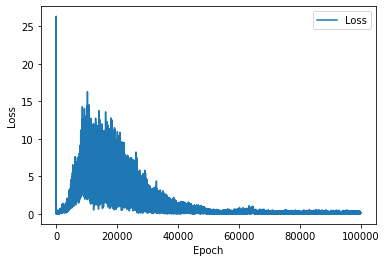

In [70]:
plt.figure()
plt.plot(losses, label="Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [71]:
#play with self
test_env = make("hungry_geese", debug=True)
for _ in range(4):
    with torch.no_grad():
        states = test_env.reset(4)
        while any(s["status"] == "ACTIVE" for s in states):
            board_act = [get_obs_action(policy_net,states,i) for i in range(4)]
            states = test_env.step([a for b,a in board_act])
    test_env.render(mode='ipython',width=WIDTH*50,height=HEIGHT*50)

In [72]:
!mkdir -p model
torch.save(obj=policy_net.state_dict(), f="model.pth")
!tar -zcvf sub.tar.gz model.pth main.py

model.pth
tar: main.py: Cannot stat: No such file or directory
tar: Exiting with failure status due to previous errors
